<h1 style="text-align:center">Exploratory Data Analysis for the California Housing census</h1>

<p style="text-align:center">Author: Jose Pena</p>
<p style="text-align:center">Github: <a href="https://github.com/JoseJuan98">JoseJuan98</a></p>
<br>

------------------------------------------------------------------------------------------------

<br>

## Purpose

The purpose of this exercise is to conduct an in-depth exploratory analysis of the California Housing dataset, using statistical and analytical techniques to gain insights into the variables and relationships between them. The resulting analysis will showcase my skills in data exploration and visualization, and provide a strong foundation for future machine learning modeling exercises.

## Goals

The goals of this exercise are to:

- Understand the distribution and relationships of the variables in the dataset.
- Identify any outliers, missing values, or other data quality issues that need to be addressed.
- Explore potential feature engineering opportunities that could improve model performance.
- Develop clear visualizations that effectively communicate insights from the data.
- Draw meaningful conclusions from the analysis that can inform the modeling process.

## Deliverables

The deliverables for this exercise will include:

- A Jupyter notebook and a report in pdf format (`reports/ExploratoryDataAnalysis.pdf`) that details the data exploration and analysis process.
- Clear visualizations that illustrate key insights from the data.
- A summary of the key findings and insights that emerged from the analysis, including any potential feature engineering opportunities or data quality issues.
- Recommendations for next steps in the modeling process based on the insights gained from the exploratory analysis.

# Setup

For this Exploratory Data Analisis project a number of Python libraries that are commonly used for data analysis and machine learning tasks will be used:

*   [`pandas`](https://pandas.pydata.org/?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkCoursesIBMML0232ENSkillsNetwork30654641-2021-01-01)  for data manipulation and analysis.
*   [`numpy`](https://numpy.org/?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkCoursesIBMML0232ENSkillsNetwork30654641-2021-01-01)  for scientific computing and mathematical operations on arrays.
*   [`seaborn`](https://seaborn.pydata.org/?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkCoursesIBMML0232ENSkillsNetwork30654641-2021-01-01) for data visualization and exploration.
*   [`matplotlib`](https://matplotlib.org/?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkCoursesIBMML0232ENSkillsNetwork30654641-2021-01-01) for creating visualizations and plots.
*   [`sklearn`](https://scikit-learn.org/stable/?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkCoursesIBMML0232ENSkillsNetwork30654641-2021-01-01) for implementing machine learning algorithms and related functions.
*   [`scipy`](https://docs.scipy.org/doc/scipy/tutorial/stats.html/?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkCoursesIBMML0232ENSkillsNetwork30654641-2021-01-01) for statistical computations and tests.

## Imports

In [1]:
import os.path

import matplotlib.colors
import pandas
import numpy
import seaborn

from scipy.stats import boxcox, ttest_ind
from matplotlib import pyplot
from pandas.plotting import scatter_matrix

from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder, MinMaxScaler

# utils.py
from pipeline.utils import fetch_housing_data, plot_scatters, \
    plot_univariate_boxplots, remove_outliers_iqr
from pipeline.config.paths import HOUSING_URL, HOUSING_PATH, PREPARED_DATA

Setting up some options:

In [2]:
# Display and store plot within the notebook
%matplotlib inline

# Show all columns when displaying dataframe
pandas.options.display.max_columns = None

 Load data, if it wasn't downloaded before it will fetch it from the URL specified, otherwise will load it from a local '.csv' file.

In [3]:
data = fetch_housing_data(url=HOUSING_URL, 
                          path=HOUSING_PATH)

# Plan of Exploration

-----------------------------------

1. [Description of data set and summary of attributes](#desc)
2. [Data Cleaning and Feature Engineering](#data_wr)
    1. Normalizing the distribution of the target variable
    2. Handling duplicated values
    3. Handling missing values
    4. Handling the outliers
    5. Encoding categorical variables
    6. Scaling numerical variables
3. [Exploratory Data Analysis (EDA)](#eda)
    1. Histogram of variables
    2. Geographical visualization
    3. Variables Correlation
4. [Hypothesis Testing](#hypo)
    1. Hypothesis one
        1. Define hypothesis
        2. Define a sample statistic
        3. Testing hypothesis by significance tests
        4. Evaluate and interpret results
    2. Hypothesis two
        1. Define hypothesis
        2. Define a sample statistic
        3. Testing hypothesis by significance tests
        4. Evaluate and interpret results
    3. Hypothesis three
        1. Define hypothesis
        2. Define a sample statistic
        3. Testing hypothesis by significance tests
        4. Evaluate and interpret results
5. [Next steps and Conclusions](#concl)
    1.  Next steps
    2. Conclusions
        1. Findings
        2. Data quality

-----------------------

<p id="desc"></p>

# 1. Description of data set and summary of attributes

This California Housing dataset is available from [Luís Torgo's page](https://www.dcc.fc.up.pt/~ltorgo/Regression/cal_housing.html) (University of Porto).

This dataset appeared in a 1997 paper titled "Sparse Spatial Autoregressions" by Pace, R. Kelley and Ronald Barry, published in the Statistics and Probability Letters journal. They built it using the 1990 California census data. It contains one row per census block group. A block group is the smallest geographical unit for which the U.S. Census Bureau publishes sample data (a block group typically has a population of 600 to 3,000 people).

The target variable or dependent variable for this analysis will be the `median_house_value`, which describes the median price of the houses per block group.

The California Housing dataset is a collection of census data for the state of California, USA, from the 1990 census.
It consists of one row per census block group, with each block group representing the smallest geographical unit for which sample data is published by the U.S. Census Bureau. The dataset was compiled by Pace and Barry and published in the Statistics and Probability Letters journal in 1997.

The dataset contains several features, including the median income, median house age, and median number of rooms per house, among others.
The target variable or dependent variable for this analysis is the `median_house_value` which represents the median price of the houses per block group.

The dataset is available from the University of Porto by the [Luís Torgo's page](https://www.dcc.fc.up.pt/~ltorgo/Regression/cal_housing.html) and is often used in regression analysis and machine learning tasks.

**Shape of the dataset**

In [4]:
data.shape

(20640, 10)

**List of columns**

In [5]:
data.columns.to_list()

['longitude',
 'latitude',
 'housing_median_age',
 'total_rooms',
 'total_bedrooms',
 'population',
 'households',
 'median_income',
 'median_house_value',
 'ocean_proximity']

**First 5 rows of the dataset**

In [6]:
data.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
0,-122.23,37.88,41.0,880.0,129.0,322.0,126.0,8.3252,452600.0,NEAR BAY
1,-122.22,37.86,21.0,7099.0,1106.0,2401.0,1138.0,8.3014,358500.0,NEAR BAY
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,352100.0,NEAR BAY
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,341300.0,NEAR BAY
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,342200.0,NEAR BAY


**Non-null values count, type of feature and memory usage**

In [7]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20640 entries, 0 to 20639
Data columns (total 10 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   longitude           20640 non-null  float64
 1   latitude            20640 non-null  float64
 2   housing_median_age  20640 non-null  float64
 3   total_rooms         20640 non-null  float64
 4   total_bedrooms      20433 non-null  float64
 5   population          20640 non-null  float64
 6   households          20640 non-null  float64
 7   median_income       20640 non-null  float64
 8   median_house_value  20640 non-null  float64
 9   ocean_proximity     20640 non-null  object 
dtypes: float64(9), object(1)
memory usage: 1.6+ MB


**Statistical properties of the dataset**

In [8]:
data.describe(include='all')

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity
count,20640.000000,20640.000000,20640.000000,20640.000000,20433.000000,20640.000000,20640.000000,20640.000000,20640.000000,20640
unique,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5
top,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,<1H OCEAN
freq,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9136
mean,-119.569704,35.631861,28.639486,2635.763081,537.870553,1425.476744,499.539680,3.870671,206855.816909,NaN
std,2.003532,2.135952,12.585558,2181.615252,421.385070,1132.462122,382.329753,1.899822,115395.615874,NaN
min,-124.350000,32.540000,1.000000,2.000000,1.000000,3.000000,1.000000,0.499900,14999.000000,NaN
25%,-121.800000,33.930000,18.000000,1447.750000,296.000000,787.000000,280.000000,2.563400,119600.000000,NaN
50%,-118.490000,34.260000,29.000000,2127.000000,435.000000,1166.000000,409.000000,3.534800,179700.000000,NaN
75%,-118.010000,37.710000,37.000000,3148.000000,647.000000,1725.000000,605.000000,4.743250,264725.000000,NaN


<p id="data_wr"></p>

# 2. Data Cleaning and Feature Engineering

Real-world data can be raw, containing repeated, missing, or irrelevant entries. If this data is used in any machine learning analysis, it can result in low accuracy or incorrect predictions. Therefore, data cleaning or data cleansing is an important technique that should be performed before any model building.

Additionally, a critical part of a successful machine learning project is creating a good set of features to train on. This process is called feature engineering, and it involves three steps:

- Feature transformation (transforming the original features)
- Feature selection (selecting the most useful features to train on)
- Feature extraction (combining existing features to produce more useful ones)

## 2.1 - Normalizing the distribution of the target variable

The distribution of the target variable, median_house_value, needs to be inspected to determine whether it is normally distributed or not, as the assumption of normal distribution must be met to perform any type of regression analysis.

There are several ways to check for this assumption. First, a visual method can be used by plotting the median_house_value distribution using the distplot() function from the seaborn library.


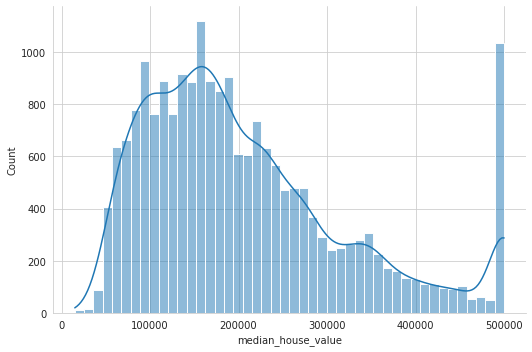

In [9]:
seaborn.displot(data['median_house_value'], height=5, aspect=1.5, kde=True);

As the plot shows, the distribution of median_house_value deviates from the normal distribution. It has a longer tail to the right, so we call it a positive skew. In statistics, skewness is a measure of the asymmetry of the distribution, while kurtosis refers to the shape of the peak in the distribution curve. Skewness and kurtosis are frequently used together to characterize the distribution of data. A normally distributed variable has a skewness of 0 and a kurtosis of 3, so any deviation from these values indicates a departure from normality.

To quantify the skewness level of this variable the `pandas.skew()` function can be used.

In [10]:
print(f'Skewness: {data.median_house_value.skew()}')

Skewness: 0.9777632739098341


The range of skewness for a fairly symmetrical bell curve distribution is between -0.5 and 0.5, while moderate skewness ranges from -0.5 to -1.0 and from 0.5 to 1.0, and highly skewed distribution ranges below -1.0 and above 1.0. In this case, the `median_house_value` variable has a skewness of approximately 0.98, which is considered moderately skewed data.

To transform this data into a more normally distributed form, we can use various methods, such as the log transformation, which can be performed using the `numpy.log()` function from the `numpy` library. You can find more information about the numpy log transform in this [documentation](https://numpy.org/doc/stable/reference/generated/numpy.log.html?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkCoursesIBMML0232ENSkillsNetwork30654641-2021-01-01).

Other ways to correct high levels of skewness in the data include the Square Root Transform (`numpy.sqrt()`) and the Box-Cox Transform (`scipy.stats.boxcox()` from the `scipy` stats library). To learn more about these methods, you can refer to this   [article](https://towardsdatascience.com/top-3-methods-for-handling-skewed-data-1334e0debf45?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkCoursesIBMML0232ENSkillsNetwork30654641-2021-01-01).

In [11]:
log_data = pandas.DataFrame(numpy.log(data.median_house_value))
sqr_data = pandas.DataFrame(numpy.sqrt(data.median_house_value))
boxcox_data = pandas.DataFrame(boxcox(data.median_house_value)[0])

In [12]:
for data_t, name in zip([log_data['median_house_value'], sqr_data['median_house_value'],
                         boxcox_data[0]], ['Log', 'Square Root', 'Box-Cox']):
    print(f'Skewness of {name} transform: {data_t.skew()}')

Skewness of Log transform: -0.17317539032496318
Skewness of Square Root transform: 0.43938209295248964
Skewness of Box-Cox transform: -0.012149399033377127


So, as the Box-Cox transform achieves the lowest skewness among the different methods, this method will be selected to transform the target data and make it more normally distributed.

In [13]:
data['median_house_value'] = pandas.DataFrame(boxcox(data.median_house_value)[0])

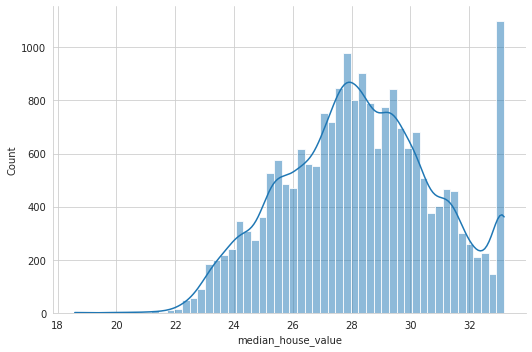

In [14]:
seaborn.displot(data.median_house_value, height=5, aspect=1.5, kde=True);

In [15]:
print(f'Skewness after box-cox transformation: {data.median_house_value.skew()}')

Skewness after box-cox transformation: -0.012149399033377127


As it can be seen, theBbox-cox method transformed the target variable distribution into a more symmetrical bell curve and the skewness level now is \~0.01, well within the range.

## 2.2 - Handling duplicated values

Before handling duplicated data, first it's checked if there are any duplicated rows

In [16]:
f'There are {data.duplicated().sum()} duplicated rows in this dataset'

'There are 0 duplicated rows in this dataset'

In addition, to check that there are not values duplicated in the index:

In [17]:
if data.index.is_unique: print('No duplicated values in the index.')
else: print('There are duplicated values in the index.')

No duplicated values in the index.


## 2.3 - Handling missing values

As previously shown in the description of the data, the variable `total_bedrooms` has missing values. To be sure the entire dataset missing values can be counted as follows:

In [18]:
f'There are {data.isna().sum().sum()} missing values in the dataset'

'There are 207 missing values in the dataset'

In [19]:
f'There are {data.total_bedrooms.isna().sum()} missing values in the variable `total_bedrooms`'

'There are 207 missing values in the variable `total_bedrooms`'

To know what to do with this missing values we can check the following:

In [20]:
data['total_bedrooms'].describe()

count    20433.000000
mean       537.870553
std        421.385070
min          1.000000
25%        296.000000
50%        435.000000
75%        647.000000
max       6445.000000
Name: total_bedrooms, dtype: float64

So, to handle the missing values a class `SimpleImputer` from [sklearn](https://scikit-learn.org/stable/index.html) can be used. There are other alternatives like directly using `pandas.fillna()`, but later on
for production ready code it will be easier to be managed by this class.

In [21]:
imputer = SimpleImputer(missing_values=pandas.NA, strategy='mean')
data.total_bedrooms = imputer.fit_transform(X=data.total_bedrooms.to_numpy().reshape(-1, 1))

In [22]:
f'Total missing values after imputation: {data.total_bedrooms.isna().sum()}'

'Total missing values after imputation: 0'

## 2.4 - Handling outliers

In statistics, an outlier is an observation point that is distant from other observations. It can be due to mistakes in data collection or recording, or to the natural high variability of data points. The treatment of outliers depends on the data and the analysis being performed. Outliers can provide valuable insights into specific behaviors, but they can also affect the accuracy of our models.

In machine learning projects, removing outliers is important during model building because their presence can mislead the model. Outliers can change the mean and standard deviation of the dataset, significantly affecting the performance of the model. They can increase the variance error and reduce the power of statistical tests.

There are many ways to identify outliers. We can use uni-variate analysis (one variable analysis) or multi-variate analysis (two or more variables). One simple way to detect an outlier is to inspect the data visually using box plots or scatter plots.

### Uni-variate Analysis


A box plot is a powerful tool for visually depicting the distribution of numerical data through their quartiles. It consists of a box that shows the middle 50% of the data, with a vertical line inside the box indicating the median. The box may also have lines extending vertically from the top and bottom (whiskers) indicating the range of the data within 1.5 times the interquartile range (IQR) above and below the upper and lower quartiles, respectively.
Any data point outside this range is considered an outlier and may be plotted as an individual point. Box plots are useful for identifying the presence of outliers, the spread of the data, and the overall shape of the distribution.

To learn more about box plots please click [here](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.boxplot.html?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkCoursesIBMML0232ENSkillsNetwork30654641-2021-01-01).


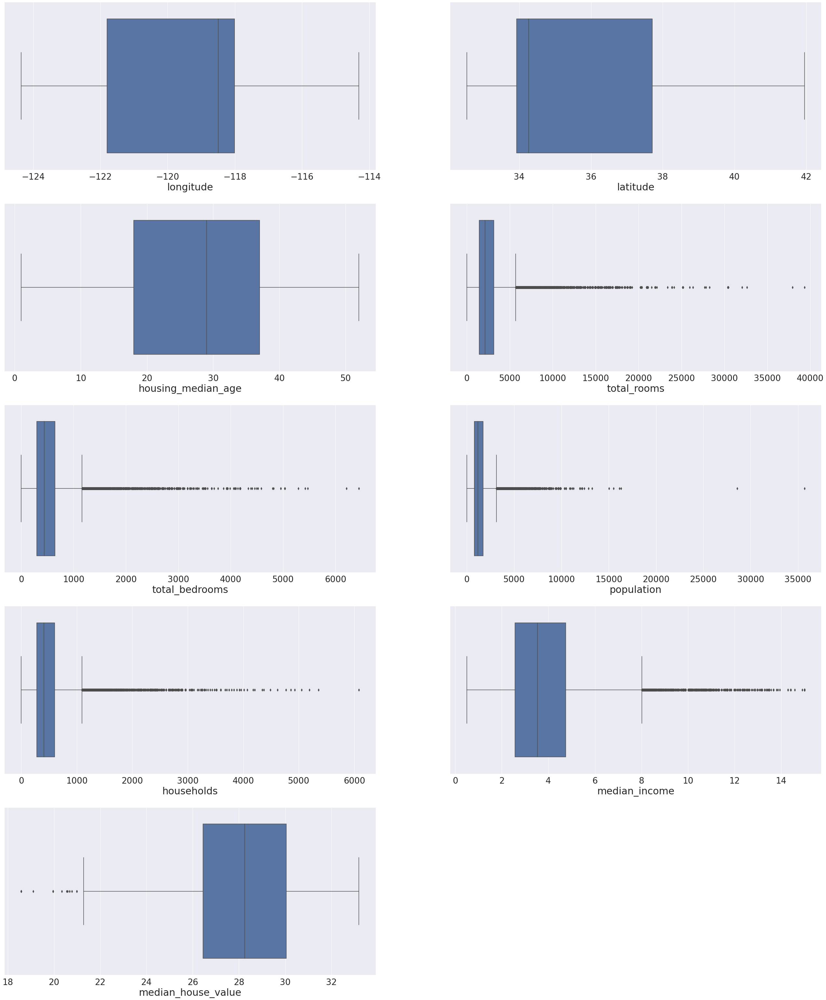

In [23]:
plot_univariate_boxplots(data=data);

As it is shown, some plots have some points plotted outside the box plot area and that greatly deviate from the rest of the population. Whether to remove or keep them will greatly depend on the understanding of our data and the type of analysis to be performed. In this case, the points that are outside of our box plots might be the actual true data points

### Bi-variate Analysis

So to know in more detail if the variables with some of these points outside of the box plot could be outliers, it can be plotted the scatter plot of the relationship between these the variables and the target variable.

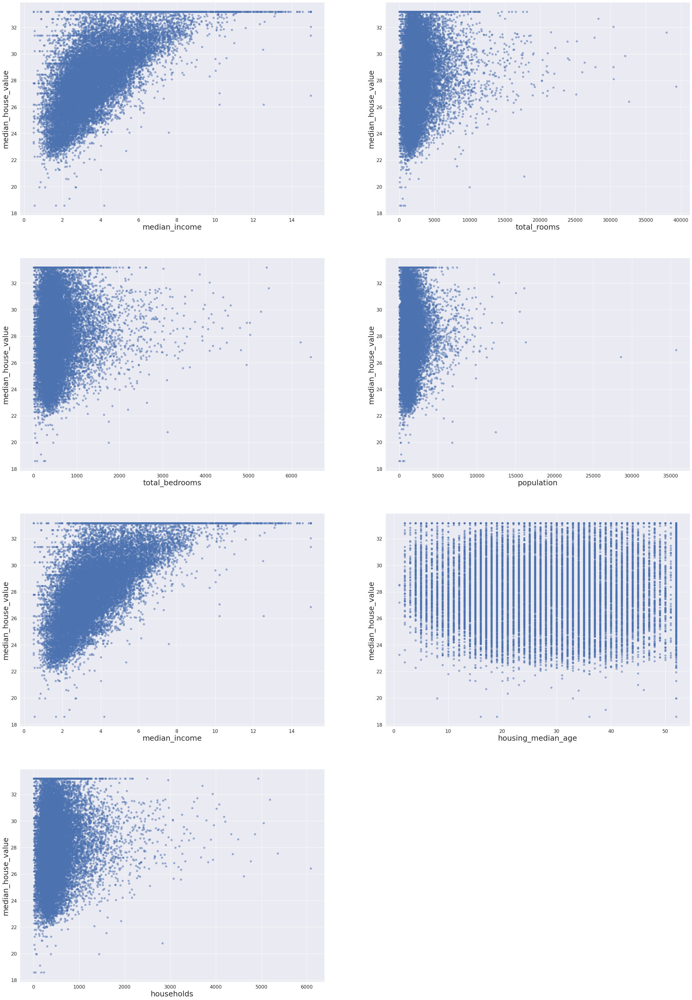

In [24]:
variables_with_outliers = ["median_income", "total_rooms", "total_bedrooms", "population", "median_income", "housing_median_age", "households"]

plot_scatters(data=data, variables=variables_with_outliers, target='median_house_value')

### Interquartile range(IQR)

The visualization of *Uni-variate* and *Bi-variate Analysis* gave an idea on how to treat the outliers. A deep understanding of the data is always needed, but if there is lack of this understanding the treatment of outliers can rely on experimentation relying on a statistical method like the interquartile range to adjust this treatment or removal.

The interquartile range is a difference between the third quartile(Q3) and the first quartile(Q1). In this method, anything lying above  Q3 + 1.5 * IQR and below Q1 – 1.5 * IQR  is considered an outlier.

$$ Q1 – 1.5 * {IQR} < {data} < Q3 + 1.5 * {IQR} $$

This 1.5, called *whisker width* in the boxplots, or *hereinafter scale* controls the sensitivity of the range and hence the decision rule. A bigger scale would make the outliers to be considered as data points while a smaller one would make some data points to be perceived as outliers. And if not sure, none of these cases is desirable.

In [25]:
for col in variables_with_outliers:
    data = remove_outliers_iqr(dataframe=data, column=col, whisker_width=1.5)

Now after applying IQR can be seen that the points are less dispersed, hence most of the outliers were removed. If still some outliers persists, the whisker width can be tuned to capture this too.

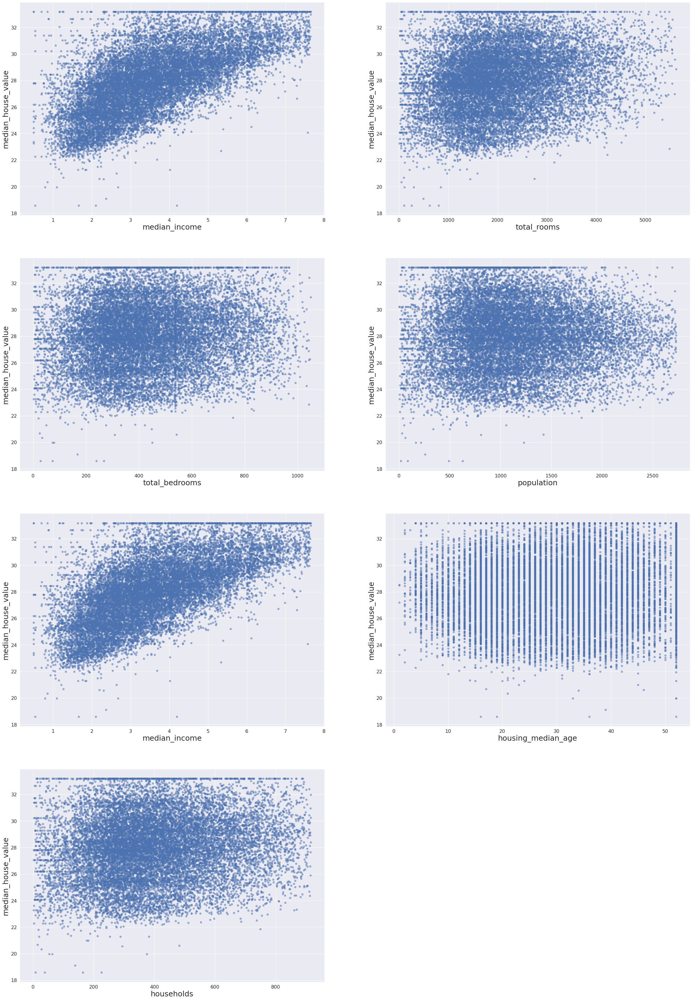

In [26]:
plot_scatters(data=data, variables=variables_with_outliers, target='median_house_value')

For interpretability reasons for the visualizations is better to make a copy before transforming the variables.

In [27]:
data_visualization = data.copy(deep=True)

## 2.5 - Encoding Categorical Variables

Categorical variables represent qualitative data with no apparent inherent mathematical meaning. Therefore, for any Machine Learning analysis, all the categorical data must be transformed into the numerical data types. The `unique()` method can be used to obtain all the categories of categorical columns.

In [28]:
categorical_variables = data.select_dtypes('object').columns.to_list()
for col in categorical_variables:
    print(f'Column {col} with categories: {data[col].unique()}')

Column ocean_proximity with categories: ['NEAR BAY' '<1H OCEAN' 'INLAND' 'NEAR OCEAN' 'ISLAND']


### One Hot Encoding

Now, to be recognized by Machine Learning algorithms, the categorical variables should be converted into numerical ones. One way to do this is through *One Hot Encoding*. To learn more about this process, please visit this [documentation](https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.OneHotEncoder.html?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkCoursesIBMML0232ENSkillsNetwork30654641-2022-01-01).

The class `OneHotEncoder` from sklearn can be used to do this transformation.

In [29]:
cat_encoder = OneHotEncoder(sparse=False, handle_unknown='ignore')

Storing original index of data to later be able to concat it with the rest of variables

In [30]:
original_index = data[categorical_variables].index

Fitting the encoder

In [31]:
new_cat_data = cat_encoder.fit_transform(data[categorical_variables])

Concating the new variables with the rest

In [32]:
new_cat_columns = cat_encoder.get_feature_names_out().tolist()
new_cat_data = pandas.DataFrame(data=new_cat_data, columns=new_cat_columns)
new_cat_data.set_index(original_index, inplace=True)

data = pandas.concat([data, new_cat_data], axis=1, join='inner')
del new_cat_data, original_index

data.drop(columns=categorical_variables, inplace=True, axis=1)

In [33]:
data.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity_<1H OCEAN,ocean_proximity_INLAND,ocean_proximity_ISLAND,ocean_proximity_NEAR BAY,ocean_proximity_NEAR OCEAN
2,-122.24,37.85,52.0,1467.0,190.0,496.0,177.0,7.2574,31.420577,0.0,0.0,0.0,1.0,0.0
3,-122.25,37.85,52.0,1274.0,235.0,558.0,219.0,5.6431,31.267611,0.0,0.0,0.0,1.0,0.0
4,-122.25,37.85,52.0,1627.0,280.0,565.0,259.0,3.8462,31.280519,0.0,0.0,0.0,1.0,0.0
5,-122.25,37.85,52.0,919.0,213.0,413.0,193.0,4.0368,30.130547,0.0,0.0,0.0,1.0,0.0
6,-122.25,37.84,52.0,2535.0,489.0,1094.0,514.0,3.6591,30.627723,0.0,0.0,0.0,1.0,0.0


## 2.6 - Scaling Continuous Variables


### Feature Scaling

One of the most important transformations to apply to the data is *Feature Scaling*. There are two common ways to get all attributes to have the same scale: `Min-max Scaling` and `Standardization`.
Min-max Scaling (or normalization) is the simplest: values are shifted and rescaled, so they end up ranging from 0 to 1. This is done by subtracting the minimum value and dividing by the maximum minus minimum value.
Standardization is different, first it subtracts the mean value (so standardized values always have a zero mean), and then it divides by the standard deviation, so that the resulting distribution has unit variance.

Sklearn library provides `MinMaxScaler` for normalization and `StandardScaler` for standardization needs. For more information on `sklearn` [`MinMaxScaler`](https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.MinMaxScaler.html?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkCoursesIBMML0232ENSkillsNetwork30654641-2021-01-01) and [`StandardScaler`](https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.StandardScaler.html?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkCoursesIBMML0232ENSkillsNetwork30654641-2021-01-01) please visit their respective documentation websites.


So, the data can be normalized, but for interpretability reasons is better to keep the target variable in the original scale, so that is easier to interpret the results.

In [34]:
norm_cols = [col for col in data.columns.tolist() if col not in new_cat_columns + ['median_house_value']]

norm_data = MinMaxScaler().fit_transform(data[norm_cols])

original_index = data[norm_cols].index

norm_data = pandas.DataFrame(data=norm_data, columns=norm_cols)
norm_data.set_index(original_index, inplace=True)

data[norm_cols] = norm_data[norm_cols]

In [35]:
data.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,ocean_proximity_<1H OCEAN,ocean_proximity_INLAND,ocean_proximity_ISLAND,ocean_proximity_NEAR BAY,ocean_proximity_NEAR OCEAN
2,0.213996,0.564293,1.0,0.260630,0.179389,0.180851,0.191676,0.944748,31.420577,0.0,0.0,0.0,1.0,0.0
3,0.212982,0.564293,1.0,0.226294,0.222328,0.203595,0.237678,0.719057,31.267611,0.0,0.0,0.0,1.0,0.0
4,0.212982,0.564293,1.0,0.289094,0.265267,0.206163,0.281490,0.467837,31.280519,0.0,0.0,0.0,1.0,0.0
5,0.212982,0.564293,1.0,0.163138,0.201336,0.150404,0.209200,0.494485,30.130547,0.0,0.0,0.0,1.0,0.0
6,0.212982,0.563231,1.0,0.450632,0.464695,0.400220,0.560789,0.441679,30.627723,0.0,0.0,0.0,1.0,0.0


<p id="eda"></p>

# 3. Exploratory Data Anlysis

Exploratory Data Analysis (EDA) is the crucial process of using summary statistics and graphical representations to perform preliminary investigations on data to uncover patterns, detect anomalies, test hypotheses, and verify assumptions.

## 3.1 - Histograms of variables

To have a first look of the data it's useful to plot the histogram of each variable.

On an overview of the variables it's clear that there are some outliers in the variables `housing_median_age` and `median_house_value`. Also, some variables are skewed, like `total_rooms`, `total_bedrooms`, `population` and `households` or not following normal patterns, such as `longitude` and `latitude`.

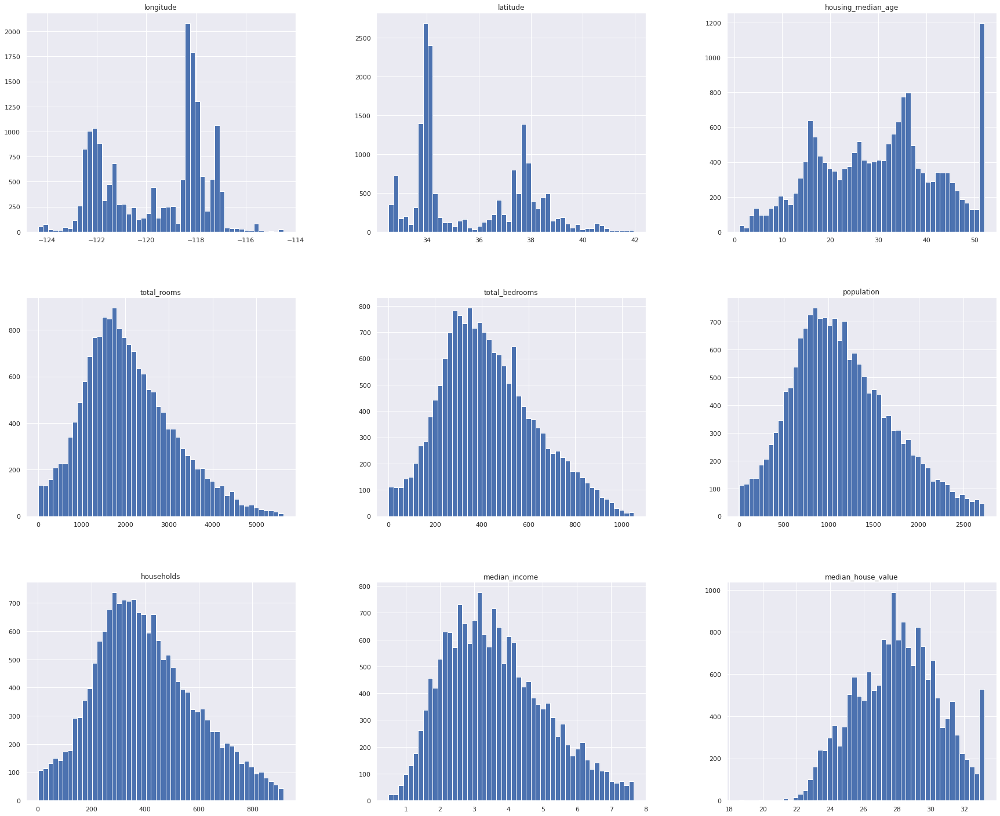

In [36]:
data_visualization.hist(bins=50, figsize=(30,25)) # .loc[:,~data_visualization.columns.isin(new_cat_columns)]
pyplot.show();

To visualize the `ocean_proximity` variable a horizontal bar plot can be used.

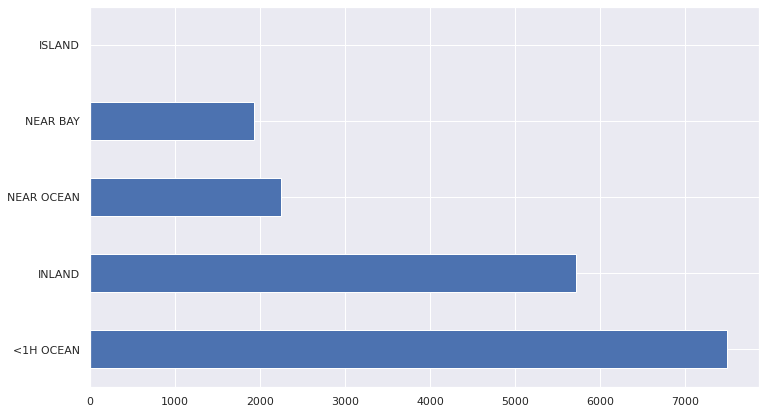

In [37]:
data_visualization.ocean_proximity.value_counts().sort_values(ascending=False).plot(kind='barh');

## 3.2 - Geographical Data

One interesting insight to understand some patterns of the data could be to see the dataset as geographical data, like a scatterplot.

This shows, as it was described previously, that they density of population and the price per geographical point are not normally distributed across the state and the mayor density of population and higher prices are around the major metropolis like the ones surrounding San Francisco, Los Angeles and Sacramento.

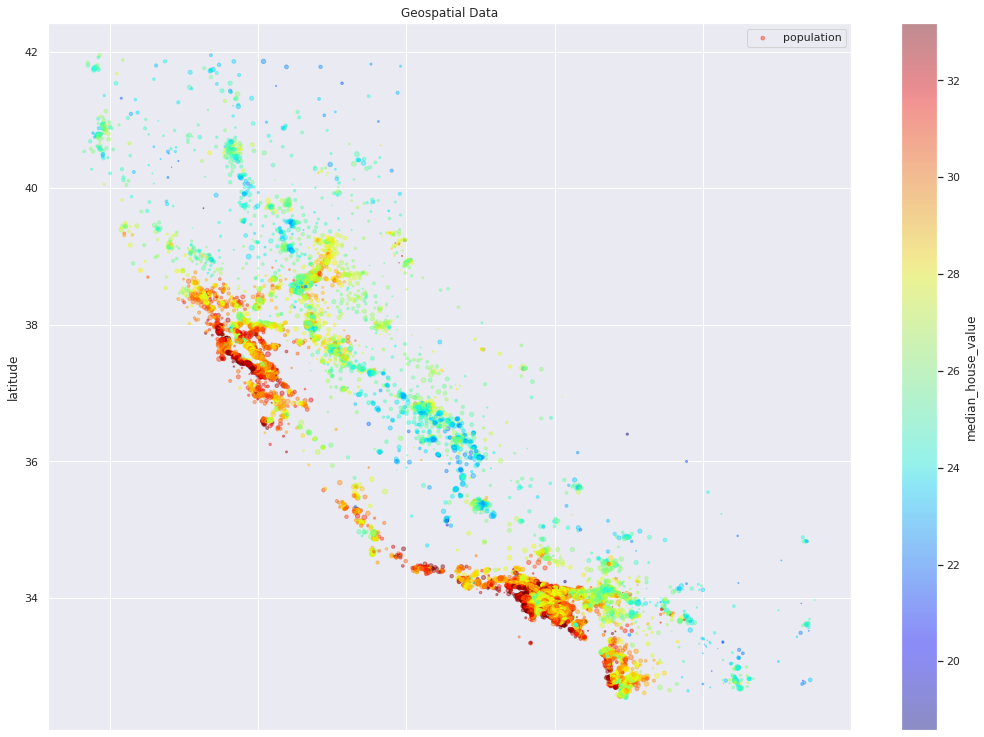

In [38]:
data_visualization.plot(kind="scatter", x="longitude", y="latitude", alpha=0.4,
                        s=data_visualization["population"]/100, label="population", figsize=(18,13),
                        c="median_house_value", cmap=pyplot.get_cmap("jet"), colorbar=True)
pyplot.title('Geospatial Data');

## 3.3 - Variables Correlation

To see how the variables correlates to the target variable, let's proceed by creating a correlation matrix for the continuous variables, which can show how important the attributes are for the median house value.
Also, this matrix can show us if there is any codependent variable.

<br>

#### Correlation of numerical values

This show the `pvalue` of the `Pearson Correlation Coefficient` between the target variable (`median_house_income`) and the rest in order of importance.

In [39]:
corr_matrix = data_visualization.corr(method='pearson').round(4)
corr_matrix["median_house_value"].sort_values(ascending=False)[1:]

median_income         0.6463
total_rooms           0.1994
households            0.1312
housing_median_age    0.1091
total_bedrooms        0.1014
longitude            -0.0102
population           -0.0108
latitude             -0.2067
Name: median_house_value, dtype: float64

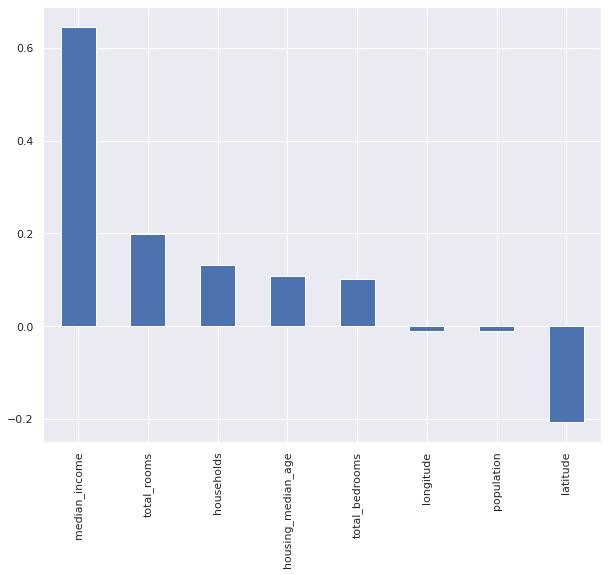

In [40]:
corr_matrix["median_house_value"].sort_values(ascending=False)[1:].plot(kind='bar', figsize=(10, 8));

To know if they are statistically significant the variables with a `pvalue` greater or equal than `0.05` can be selected.

In [41]:
significant_vars = corr_matrix["median_house_value"].sort_values(ascending=False)[1:].loc[corr_matrix["median_house_value"].sort_values(ascending=False)[1:] > 0.05].index.values.tolist()

#### Collinearity Visual Check

To check if there are any collinearity within the independent variables it can be plotted the scatter plot of each variable with the rest of variables to check if there is any clearn pattern that could show such a phenomena.

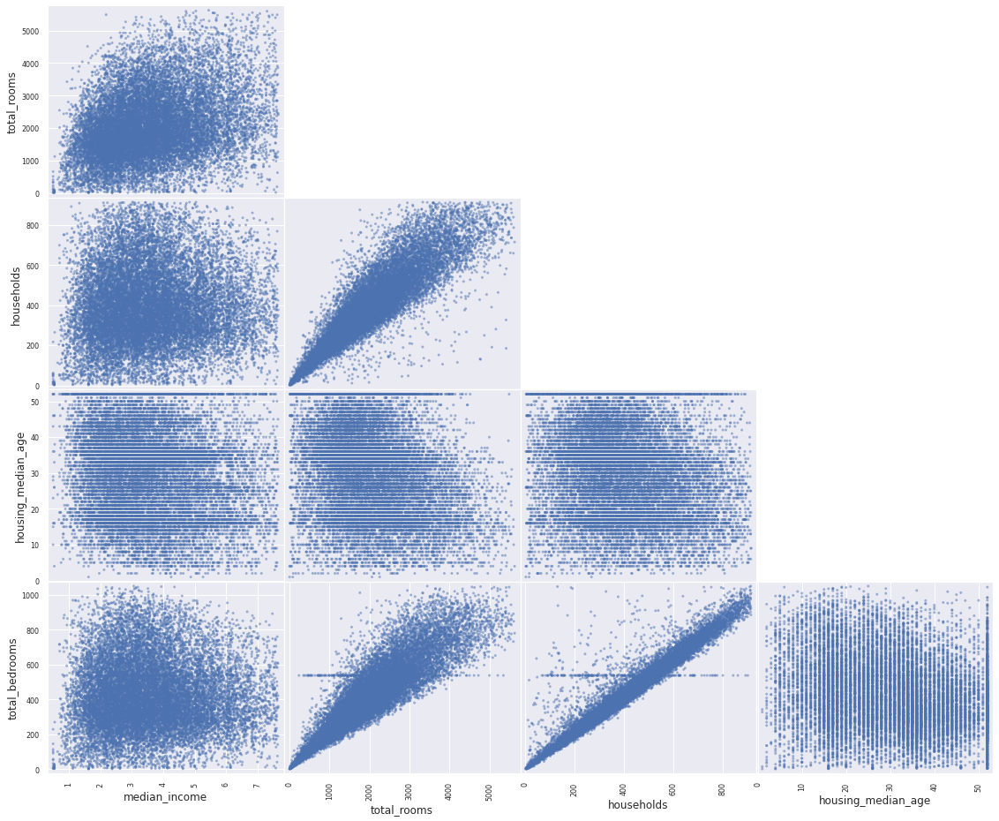

In [42]:
scatter_plots = scatter_matrix(data_visualization[significant_vars], figsize=(24, 20));

for i in range(len(significant_vars)):
    for j in range(len(significant_vars)):
        if i-1 < j:
            scatter_plots[i,j].set_visible(False)

pyplot.show()

The variable `total_rooms` show a clear collinearity with the variable `households`. This need to be treated to produce a quality Machine Learning Modelling, but it's out of the scope of this analysis, so it will be taken in consideration for the next exercises based in this one.

<br>

#### Bivariate Analysis

Another insightfull visualization is the a bivariate visual analysis of the most statistically significant variables with the target variable.

In [43]:
corr_matrix["median_house_value"].sort_values(ascending=False)[1:]

median_income         0.6463
total_rooms           0.1994
households            0.1312
housing_median_age    0.1091
total_bedrooms        0.1014
longitude            -0.0102
population           -0.0108
latitude             -0.2067
Name: median_house_value, dtype: float64

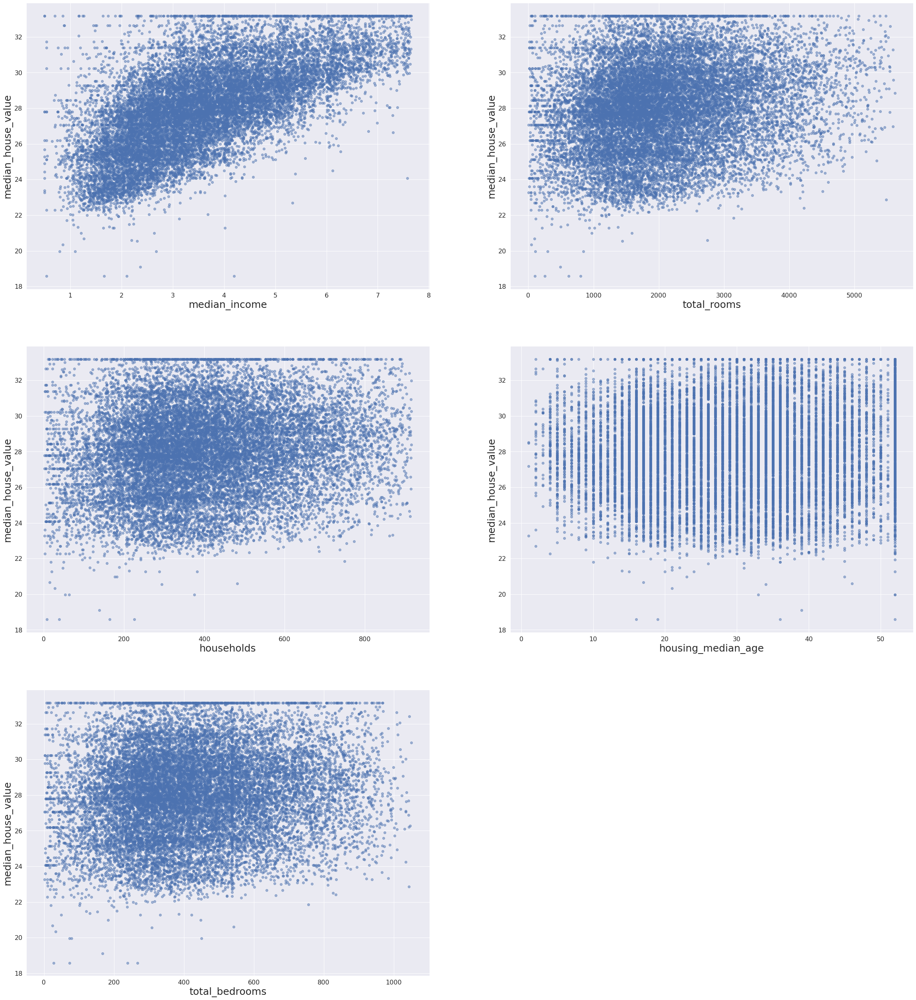

In [44]:
plot_scatters(data=data_visualization, variables=significant_vars, target='median_house_value')

As [corr(method='pearson')](https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.corr.html) uses `Pearson Correlation Coefficient` to compute the correlation between continuous variables, so for categorical variables we will need to use other tests, such as `Chi-squared test`.

<p id='hypo'></p>

# 4. Hypothesis Testing

Defining hypothesis about the data will provide more insights about it.


The hypothesis is defined in two ways - null hypothesis and alternative hypothesis.

* Null hypothesis is a statistical hypothesis which assumes that the difference in observations is due to a random factor. It is denoted by

$$
H_0
$$

* Alternative hypothesis is the opposite of null hypothesis. It assumes that the difference in observations is the result of a real effect. The alternate hypothesis is denoted by

$$
H_1
$$

After defining the hypothesis, it's needed to set the criteria for a decision, it states the level of significance for a test. It could be 5%, 1% or 0.5%. Based on the level of significance, a decision can be made whether to accept the null hypothesis and reject the alternate, and vise versa.

And then finally evaluate and interpret the result to get to a conclusion.

The `prepared_data` will be used for Hypothesis testing, which has been prepared for this and `original_data` will be used for interpretability reason, like to plot something.

In [45]:
# To not compute all the cells above and save the prepared data for later
data_visualization['index'] = data_visualization.index
data_visualization.to_csv(path_or_buf=PREPARED_DATA, sep=';', index=False, header=True)

In [46]:
prepared_data = pandas.read_csv(filepath_or_buffer=PREPARED_DATA, sep=';', header=0, index_col='index')

original_data = pandas.read_csv(filepath_or_buffer='data/housing.csv', low_memory=False)

## 4.1 - Hypothesis One

It will be proved or disproved that houses near bay or ocean have higher prices compare with inland houses.

### 4.1.1 - Define a sample statistic

It's needed the sample of houses near bay and those which are not near.


In [47]:
near_bay_ocean_houses = prepared_data.loc[prepared_data['ocean_proximity'].isin(['NEAR BAY', 'NEAR OCEAN'])]
inland_houses = prepared_data.loc[prepared_data['ocean_proximity'] == 'INLAND']

### 4.1.2 - Define hypothesis

Let's define the Null and Alternative Hypothesis:

Being, $\mu_{1}:$ the mean value of near bay and ocean houses and,
$\mu_{2}:$ the mean value of inland houses.

$H_0: \mu_{1} <= \mu_{2}$ The mean value of near ocean and bay houses is less or equal than the ones inland.
$H_1: \mu_{1} > \mu_{2}$ The mean value of near ocean or bay houses is higher than the ones inland.

The ‘>’ sign in the alternate hypothesis indicates the test is *right tailed*. To compare the mean values of near bay and ocean and inland populations, so `t-test` will be used. If `z-values` (calculated from a t-test) fall into the area on the right side of a distribution curve, this would cause us to reject the null hypothesis.

First the mean values of each sample can be checked, but as the target variable was normalized the values lost interpretability, so the original data can be used to just gave an idea and visualize it, but for the statistical test it is needed to be done with the normalized target in order to work.

In [48]:
mean_near_oc_bay = original_data.loc[original_data['ocean_proximity'].isin(['NEAR BAY', 'NEAR OCEAN'])].median_house_value.mean()
mean_inland = original_data.loc[original_data['ocean_proximity'] == 'INLAND'].median_house_value.mean()

In [49]:
f' Mean value of houses near bay or ocean: {round(mean_near_oc_bay, 4)}'

' Mean value of houses near bay or ocean: 253959.5202'

In [50]:
f' Mean value of houses inland: {round(mean_inland, 4)}'

' Mean value of houses inland: 124805.392'

Both samples can be plotted by using seaborn `boxplot()` function. It is always useful to have a visual representation of the data which is being tested.

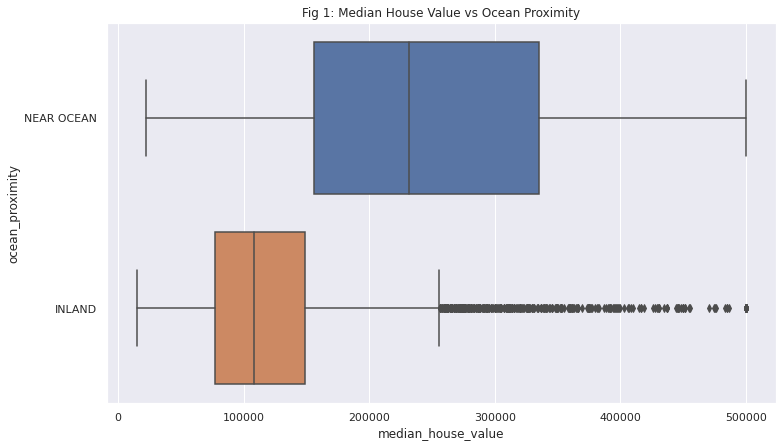

In [51]:
data2plot = original_data.copy()
data2plot.ocean_proximity = original_data.ocean_proximity.str.replace('NEAR BAY', 'NEAR OCEAN')
data2plot = data2plot.loc[data2plot.ocean_proximity.isin(['NEAR OCEAN', 'INLAND'])]

seaborn.boxplot(x=data2plot.median_house_value, y=data2plot.ocean_proximity, data=data2plot).set(title='Fig 1: Median House Value vs Ocean Proximity');

By checking the mean and visualizing the data is possible to make an assumption if to reject or fail to reject the null hypothesis, but to prove it rigorously let's test the hypothesis by a significance test.


### 4.1.3 - Testing hypothesis by significance tests

To set the criteria for a decision, for this test the level of significance will be 5%. Based on the level of significance, a decision can be made whether to accept the null hypothesis and reject the alternate, and vise versa.

To calculate the *t-value* and *p-value* of the *t-test* for both samples using the data prepared with the normalized target it can be used the method `ttest_ind()` from `scipy.stats`.

In [52]:
alpha = 0.05
t_value_1, p_value_1 = ttest_ind(a=prepared_data.loc[prepared_data.ocean_proximity == 'NEAR OCEAN'].median_house_value,
                             b=prepared_data.loc[prepared_data.ocean_proximity == 'INLAND'].median_house_value)
p_value_onetail = p_value_1/2
print(f't-value: {t_value_1}, p-value: {p_value_1}, p-value-onetail: {p_value_onetail}')

t-value: 56.92941220506621, p-value: 0.0, p-value-onetail: 0.0


### 4.1.4 - Evaluate and interpret results

Next, although optional, it is useful to print ‘if/else’ statements to make our conclusions about the hypothesis.

In [53]:
msg1 = f"Conclusion: since p_value {p_value_1} is "+'{}'+ f" than alpha {alpha}"
msg2 = "{} the null hypothesis that the mean value of near ocean and bay houses is {} than the ones inland."

if p_value_1 < alpha:
    print(msg1.format('less'))
    print(msg2.format("Reject", "less or equal"))

else:
    print(msg1.format('greater'))
    print(msg2.format("Fail to reject", "greater"))

Conclusion: since p_value 0.0 is less than alpha 0.05
Reject the null hypothesis that the mean value of near ocean and bay houses is less or equal than the ones inland.


## 4.2 - Hypothesis 2

It will be proved or disproved that houses higher populated areas have higher prices compare with the ones in low populated areas.

### 4.2.1 - Define a sample statistic

To define the sample to be tested it’s needed the sample of houses in high populated areas and the one in low populated areas.

In [54]:
median_population = original_data.population.median()
low_population_houses = original_data.loc[original_data.population <= median_population]
high_population_houses = original_data.loc[original_data.population > median_population]


### 4.2.2 - Define hypothesis

Let's define the Null and Alternative Hypothesis:

Being, $\mu_{1}:$ the mean value of high population area houses and,
$\mu_{2}:$ the mean value of low population areas

$H_0: \mu_{1} <= \mu_{2}$ The mean value of houses in high populated areas is less or equal than the ones low populated areas.
$H_1: \mu_{1} > \mu_{2}$ The mean value of houses in high populated areas is higher than the ones in low populated areas.

The ‘>’ sign in the alternate hypothesis indicates the test is *right tailed*. To compare the mean values of low and high populated populations, so `t-test` will be used. If `z-values` (calculated from a t-test) fall into the area on the right side of a distribution curve, this would cause us to reject the null hypothesis.

As in the previous hypothesis, first the mean values of each sample can be checked, but as the target variable was normalized the values lost interpretability, so the original data can be used to just gave an idea and visualize it, but for the statistical test it is needed to be done with the normalized target in order to work.

In [55]:
mean_high_population = high_population_houses.median_house_value.mean()
mean_low_population = low_population_houses.median_house_value.mean()

In [56]:
f' Mean value of houses in high populated areas: {round(mean_high_population, 4)}'

' Mean value of houses in high populated areas: 201573.4199'

In [57]:
f' Mean value of houses in low populated areas: {round(mean_low_population, 4)}'

' Mean value of houses in low populated areas: 212133.0978'

Both samples can be plotted by using seaborn `boxplot()` function. It is always useful to have a visual representation of the data which is being tested.

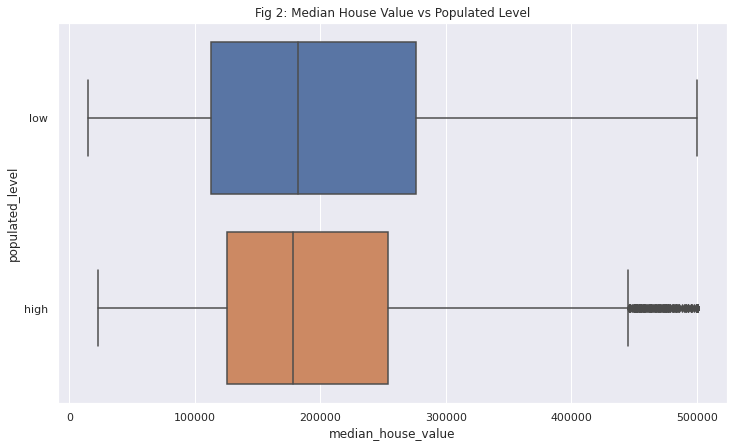

In [58]:
def populated_level(x):
    if x <= median_population:
        return 'low'
    else:
        return 'high'

data2plot_pop = original_data.copy()
data2plot_pop['populated_level'] = data2plot_pop.population.apply(populated_level)

seaborn.boxplot(x=data2plot_pop.median_house_value, y=data2plot_pop.populated_level, data=data2plot_pop).set(title='Fig 2: Median House Value vs Populated Level');


### 4.2.3 - Testing hypothesis by significance tests

To set the criteria for a decision, for this test the level of significance will be 5%. Based on the level of significance, a decision can be made whether to accept the null hypothesis and reject the alternate, and vise versa.
To calculate the t-value and p-value of the t-test for both samples using the data prepared with the normalized target it can be used the method `ttest_ind()` from `scipy.stats`.


In [59]:
alpha_2 = 0.05
t_value_2, p_value_2 = ttest_ind(a=prepared_data.loc[prepared_data.population > median_population].median_house_value,
                             b=prepared_data.loc[prepared_data.population <= median_population].median_house_value)
p_value_onetail_2 = p_value_2/2
print(f't-value: {t_value_2}, p-value: {p_value_2}, p-value-onetail: {p_value_onetail_2}')

t-value: -3.2799648943294963, p-value: 0.0010402408950152143, p-value-onetail: 0.0005201204475076071



### 4.2.4 - Evaluate and interpret results


In [60]:
msg1 = f"Conclusion: since p_value {p_value_2} is "+'{}'+ f" than alpha {alpha_2}"
msg2 = "{} the null hypothesis that the mean value of houses in high populated areas is {} than the ones in low populated areas."

if p_value_2 < alpha_2:
    print(msg1.format('less'))
    print(msg2.format("Reject", "less or equal"))

else:
    print(msg1.format('greater'))
    print(msg2.format("Fail to reject", "greater"))

Conclusion: since p_value 0.0010402408950152143 is less than alpha 0.05
Reject the null hypothesis that the mean value of houses in high populated areas is less or equal than the ones in low populated areas.


## 4.3 - Hypothesis 3

It will be proved or disproved that areas with newer median age houses with less or equal than 10 years have higher value than house with more or equal than 20 years of median age.

### 4.3.1 - Define a sample statistic

To define the sample to be tested it’s needed the sample of houses with less than 10 years and more than 20 years of median age.

In [61]:
newer_houses = original_data.loc[original_data.housing_median_age <= 10]
older_houses = original_data.loc[original_data.housing_median_age > 20]


### 4.3.2 - Define hypothesis

Let's define the Null and Alternative Hypothesis:

Being, $\mu_{1}:$ the mean value house are with median age lower or equal than 10 and,
$\mu_{2}:$ the mean value of houses with median age higher than 20.

$H_0: \mu_{1} <= \mu_{2}$ The mean value of houses with meadian age lower or equal than 10 is less or equal than the ones higher than 20.
$H_1: \mu_{1} > \mu_{2}$ The mean value of houses with meadian age lower or equal than 10 is higher than the ones higher than 20.

The ‘>’ sign in the alternate hypothesis indicates the test is *right tailed*. To compare the mean values of the value of newer and older houses, `t-test` will be used. If `z-values` (calculated from a t-test) fall into the area on the right side of a distribution curve, this would cause us to reject the null hypothesis.

As in the previous hypothesis, first the mean values of each sample can be checked, but as the target variable was normalized the values lost interpretability, so the original data can be used to just gave an idea and visualize it, but for the statistical test it is needed to be done with the normalized target in order to work.

In [62]:
mean_newer_houses = newer_houses.median_house_value.mean()
mean_old_houses = older_houses.median_house_value.mean()

print(f' Mean value of houses with median age lower or equal than 10: {round(mean_newer_houses, 4)}')
print(f' Mean value of houses older than 20 years: {round(mean_old_houses, 4)}')

 Mean value of houses with median age lower or equal than 10: 200263.2549
 Mean value of houses older than 20 years: 212737.7854


Both samples can be plotted by using seaborn `boxplot()`` function. It is always useful to have a visual representation of the data which is being tested.

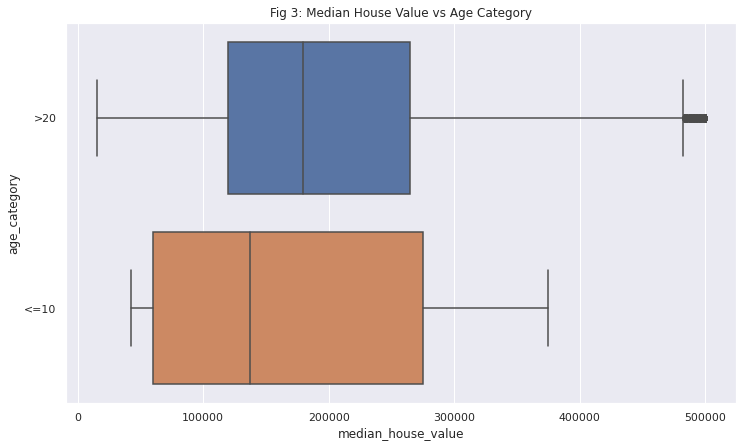

In [63]:
def age_category(x):
    if x <= 10:
        return '<=10'
    else:
        return '>20'

data2plot_pop = original_data.copy()
data2plot_pop['age_category'] = data2plot_pop.population.apply(age_category)

seaborn.boxplot(x=data2plot_pop.median_house_value, y=data2plot_pop.age_category, data=data2plot_pop).set(title='Fig 3: Median House Value vs Age Category');


### 4.2.3 - Testing hypothesis by significance tests

To set the criteria for a decision, for this test the level of significance will be 5%. Based on the level of significance, a decision can be made whether to accept the null hypothesis and reject the alternate, and vise versa.
To calculate the t-value and p-value of the t-test for both samples using the data prepared with the normalized target it can be used the method `ttest_ind()` from `scipy.stats`.


In [64]:
alpha_3 = 0.05
t_value_3, p_value_3 = ttest_ind(a=prepared_data.loc[prepared_data.housing_median_age <= 10].median_house_value,
                             b=prepared_data.loc[prepared_data.housing_median_age > 20].median_house_value)
p_value_onetail_3 = p_value_3/2
print(f't-value: {t_value_3}, p-value: {p_value_3}, p-value-onetail: {p_value_onetail_3}')

t-value: -3.674609158905402, p-value: 0.00023911922463414962, p-value-onetail: 0.00011955961231707481



### 4.3.4 - Evaluate and interpret results



In [65]:
msg1 = f"Conclusion: since p_value {p_value_3} is "+'{}'+ f" than alpha {alpha_3}"
msg2 = "{} the null hypothesis that the mean value of houses with median house age less or equal than 10 is {} than the ones older than 20 years."

if p_value_3 < alpha_3:
    print(msg1.format('less'))
    print(msg2.format("Reject", "less or equal"))

else:
    print(msg1.format('greater'))
    print(msg2.format("Fail to reject", "greater"))

Conclusion: since p_value 0.00023911922463414962 is less than alpha 0.05
Reject the null hypothesis that the mean value of houses with median house age less or equal than 10 is less or equal than the ones older than 20 years.


<p id="concl"></p>

# 5. Next steps and Conclusions 

## 5.1 - Next steps

This is exercise can be used as the base of a future machine learning modeling exercise. Also, some points could be dived deeper like in the correlation of variables which show a clear case of collinearity of the variable `total_rooms` with `households`, new variables could be derived from these ones and teament or derivation of variables from geoprahical data.


## 5.2 - Conclusions

The purpose of exploratory analysis, therefore this exercise, is to help look at data before making any assumptions. It can help identify obvious errors, as well as better understand patterns within the data, detect outliers or anomalous events, find interesting relations among the variables.

Once this analysis is complete and insights are drawn, its features can then be used for more sophisticated data analysis or modeling, including machine learning.

The data used in this exercise had a good quality in terms of consistency and completeness.

<br>

## Author

<p>Author: Jose Pena</p>
<p>Github: <a href="https://github.com/JoseJuan98">JoseJuan98</a></p>

## Change Log

| Date (YYYY-MM-DD) | Version | Changed By | Change Description   |
| ----------------- | ------- | ---------- | -------------------- |
| 2022-11-07        | 1.0     | Jose       | First version        |
